In [18]:
%run _bootstrap_dev.ipynb

Libreria k_functions importata.
Libreria r_functions importata.
Libreria t_functions importata.
Libreria mc_functions importata.
Libreria k_tickers importata.
Libreria k_strategies importata.
Libreria k_portfolios importata.
Libreria r_portfolios importata.
Libreria l_portfolios importata.


Verifica naming di funzioni...

✅ Nessun duplicato in k_functions.ipynb
✅ Nessun duplicato in k_strategies.ipynb
✅ Nessun duplicato in k_tickers.ipynb
✅ Nessun duplicato in mc_functions.ipynb
✅ Nessun duplicato in r_functions.ipynb
✅ Nessun duplicato in s_functions.ipynb
✅ Nessun duplicato in t_functions.ipynb
✅ Nessun duplicato in u_functions.ipynb

✅ Nessun nome di funzione ripetuto su file diversi.

Libreria u_functions importata

Runtime dev completato.


## §2 — Portafoglio da analizzare

In [19]:
#
# Quale portafoglio analizzare
#
# portfolio = portfolio_alpha_euro
# portfolio = portfolio_alpha_sect
# portfolio = portfolio_alpha_world
# portfolio = portfolio_alpha_world_vanguard
# portfolio = portfolio_alpha_nasdaq100
# portfolio = portfolio_alpha_sp100
# portfolio = portfolio_germany_plan
# portfolio = portfolio_italy_big_cap
# portfolio = portfolio_alpha_quant # New Ema
portfolio = portfolio_alpha_fact

# Profile di destinazione del PTF nel portafoglio del cliente
# Determina le soglie di overfitting check (S1-S4).
# "satellite": quota tattica, cerca alpha; "core": quota di base, prioritizza capital preservation.
profile = "satellite"   # "satellite" | "core"

# --- Derivazione automatica dalle proprieta' del portfolio ---
tickers = portfolio['tickers']
tickers = (
    extract_tickers_from_wikipedia(tickers, exclude=["GOOG"], rename={"BRK.B": "BRK-B"})
    if isinstance(tickers, str)
    else list(tickers)
)
benchmark_portfolio = portfolio['benchmark_portfolio']
benchmark_title     = portfolio['benchmark_title']
portfolio_title     = portfolio['Title']

# Percorso file WFO
wfo_results_dir = _TSLAB_DEV_R_WFO_RESULTS_DIR
wfo_file_save   = f"{wfo_results_dir}/{portfolio_title}_{year}.wfo_summary.csv"

# Date di analisi
start_date = "2015-01-01"
end_date   = None          # None = oggi
year       = 2026          # anno di selezione corrente

print(f"Portafoglio: {BOLD}{portfolio_title}{RESET}  |  Profile: {BOLD}{profile}{RESET}")
print(f"Ticker: {len(tickers)}  |  Benchmark: {benchmark_title}")
print(f"WFO file: {wfo_file_save}")

from pathlib import Path as _Path
reports_dir = _Path("reports")
plots_dir   = reports_dir / "plots" / f"{portfolio_title}_{year}"
plots_dir.mkdir(parents=True, exist_ok=True)
print(f"reports_dir: {reports_dir}")
print(f"plots_dir: {plots_dir}")

Portafoglio: Alpha Fact  |  Profile: satellite
Ticker: 5  |  Benchmark: Indice sintetico fattoriali
WFO file: ../../outputs/WFO_R_DEV_RESULTS/Alpha Fact_2026.wfo_summary.csv
reports_dir: reports
plots_dir: reports/plots/Alpha Fact_2026


## §3 — Download data

In [20]:
init_cash      = 100_000
normalize      = False    # lasciare False nei rotazionali: NaN = titolo assente
lookback_buffer = 365

download_start_date = (pd.to_datetime(start_date) - timedelta(days=lookback_buffer)).strftime("%Y-%m-%d")

stocks_data, company_data = fetch_data_and_companies(
    tickers, download_start_date, end_date, normalize=normalize
)
stocks_data_raw = download_data(tickers, download_start_date, end_date, auto_adjust=False)

# Usato dalla Stability Analysis 
portfolio["stocks_data"] = stocks_data
portfolio["init_cash"]   = init_cash

if benchmark_portfolio:
    benchmark_data     = build_benchmark(benchmark_portfolio,
                             stocks_data.index.min(), stocks_data.index.max()).replace(0, np.nan).ffill()
    benchmark_data_raw = build_benchmark(benchmark_portfolio,
                             stocks_data.index.min(), stocks_data.index.max(),
                             auto_adjust=False).replace(0, np.nan).ffill()
elif benchmark_title:
    benchmark_data     = download_data(benchmark_title, stocks_data.index.min(), end_date)
    benchmark_data_raw = download_data(benchmark_title, stocks_data_raw.index.min(), end_date,
                                       auto_adjust=False)
else:
    benchmark_data = benchmark_data_raw = None

display(stocks_data)

/tmp/ipykernel_6506/2511927931.py:238: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.

[*********************100%***********************]  9 of 9 completed
[*********************100%***********************]  9 of 9 completed


Ticker,IUSN.DE,IWMO.MI,IWQU.MI,IWVL.MI,XDEV.MI
Date,,,,,
2015-02-17,NaN,23.690001,NaN,NaN,NaN
2015-02-18,NaN,23.820000,NaN,NaN,NaN
2015-02-19,NaN,NaN,23.430000,NaN,NaN
2015-02-20,NaN,NaN,23.455000,22.965000,NaN
2015-02-24,NaN,24.285000,NaN,23.230000,NaN
...,...,...,...,...,...
2026-05-22,8.762,98.959999,74.500000,66.559998,68.449997
2026-05-25,8.872,100.059998,74.959999,67.500000,69.400002
2026-05-26,8.871,100.599998,74.529999,68.169998,70.129997


In [22]:
risk_off_tickers_uniq = [
    t for t in risk_off_tickers
    if t not in tickers
]

# Tickers da usare in modalita risk_off (difensivi)
risk_off_data = download_data(risk_off_tickers_uniq, download_start_date, end_date) if risk_off_tickers else None
# workaround: forza sempre DataFrame
if isinstance(risk_off_data, pd.Series):
    risk_off_data = risk_off_data.to_frame()

## §4 — Stability Analysis

Valuta la coerenza dei flag binari della griglia su sotto-periodi storici.
Flag coerentemente negativi vengono fissati a `False` nella griglia ridotta
passata al WFO Standard.

> **Nota**: la stability si applica solo al path WFO Standard.
> WFO Clusterizzata (§5b) usa `build_cluster_grids` internamente e ignora la griglia esterna
> (debito metodologico documentato in CLAUDE.md).

In [23]:
# Griglia completa — definita qui per essere condivisa tra stability e WFO
full_grid = {
    "rebalance_frequency":    ["QE", "ME"],
    "momentum_lookback_days": [10, 20, 40, 60],
    "riskparity_lookback_days": [10, 20, 40, 60],
    "n_top":                  [1, 5, 8, 10],
    "use_acceleration":       [True, False],
    "momentum_weight":        [0.5, 0.7, 1.0],
    "filter_ema":             [True, False],
    "filter_volatility":      [True, False],
    "filter_min_momentum":    [True, False],
}

# full_grid = {
#     "rebalance_frequency":    ["QE", "ME"],
#     "momentum_lookback_days": [10, 20, 40, 60],
#     "riskparity_lookback_days": [10, 20, 40, 60],
#     "n_top":                  [1],
#     "use_acceleration":       [True, False],
#     "momentum_weight":        [0.5, 0.7, 1.0],
#     "filter_ema":             [True, False],
#     "filter_volatility":      [True, False],
#     "filter_min_momentum":    [True, False],
# }

# Parametri WFO (condivisi tra Standard e pipeline interna Cluster)
ratio                  = "3:1"
metric                 = "Sharpe Ratio"
cores                  = -1
verbose                = False
force_next_year_params = True

n_full_trials = len(list(__import__('itertools').product(*full_grid.values())))
print(f"Full grid size: {n_full_trials} combinazioni")

Full grid size: 6144 combinazioni


In [24]:
if len(tickers) > 3:
    start_date_stability = stocks_data.dropna(how='all').index.min()
    print(f"Stability start effettivo: {start_date_stability.date()}")
    
    reduced_grid, stability_report = reduce_grid_via_stability(
        ptf_config       = portfolio,
        full_grid        = full_grid,
        full_start_date  = start_date_stability,
        full_end_date    = end_date,
        metric           = "CAGR",
        k                = 3,
        verbose          = True,
    )
    
    n_reduced_trials = len(list(__import__('itertools').product(*reduced_grid.values())))
    print(f"Reduced grid size: {n_reduced_trials} combinazioni ({n_full_trials - n_reduced_trials} eliminate)")
    
    # Salva stability report come CSV (audit trail)
    import os
    stability_report_path = f"data/stability_reports/{portfolio_title}_{year}_stability.csv"
    os.makedirs(os.path.dirname(stability_report_path), exist_ok=True)
    stability_report.to_csv(stability_report_path, index=False)
    print(f"Stability report salvato: {stability_report_path}")
    
    display(stability_report)
else:
    print(f"Universo troppo piccolo (n. tickers {len(tickers)}). Uso la griglia intera")
    reduced_grid =  full_grid

Stability start effettivo: 2015-02-17
[WARN] n_top_anchors adattato automaticamente: richiesto=[3, 5, 8], usato=[2], universe_size=5, margin=3
  Evaluating filter_ema …
  Evaluating filter_min_momentum …
  Evaluating filter_volatility …
  Evaluating use_acceleration …

=== Stability Analysis Diagnostic Report ===
          flag_name  evaluated  mean_delta  coherent_sign  recommended_value                        diagnostic_note
         filter_ema       True   -0.013197          False              False incoherent: mixed signs across periods
filter_min_momentum       True   -0.027426           True              False                      coherent negative
  filter_volatility       True    0.010310          False              False incoherent: mixed signs across periods
   use_acceleration       True   -0.028327          False              False incoherent: mixed signs across periods

Grid: 6144 → 384 combinations (16.0x reduction)
Reduced grid size: 384 combinazioni (5760 eliminate)
Sta

,flag_name,evaluated,mean_delta,coherent_sign,recommended_value,diagnostic_note,delta_per_period,delta_per_period_per_anchor
0,filter_ema,True,-0.013197,False,False,incoherent: mixed signs across periods,"[0.010488301560478863, -0.03762912558881926, -...","[[0.010488301560478863], [-0.03762912558881926..."
1,filter_min_momentum,True,-0.027426,True,False,coherent negative,"[-0.0011106470393411616, -0.06636071915831532,...","[[-0.0011106470393411616], [-0.066360719158315..."
2,filter_volatility,True,0.010310,False,False,incoherent: mixed signs across periods,"[0.023884059958947157, 0.008001250764224643, -...","[[0.023884059958947157], [0.008001250764224643..."
3,use_acceleration,True,-0.028327,False,False,incoherent: mixed signs across periods,"[0.0331882602219824, -0.0964347614522354, -0.0...","[[0.0331882602219824], [-0.0964347614522354], ..."


## §5 — Run WFO

### §5a — WFO Standard

Usa la `reduced_grid` prodotta dalla stability analysis.

Benchmark start:         2015-02-17
Primo anno pieno comune: 2016-01-01
Pipeline start:          2013-01-01
Primo OOS atteso:        2016-01-01

STEP 1 — WFO Standard (clustering disabilitato)


WFO Parallel:   0%|          | 0/12 [00:00<?, ?it/s]

WFO Results Standard — Alpha Fact



STEP 6 — Costruzione portafogli

▶ Portafoglio CON Risk ON/OFF...


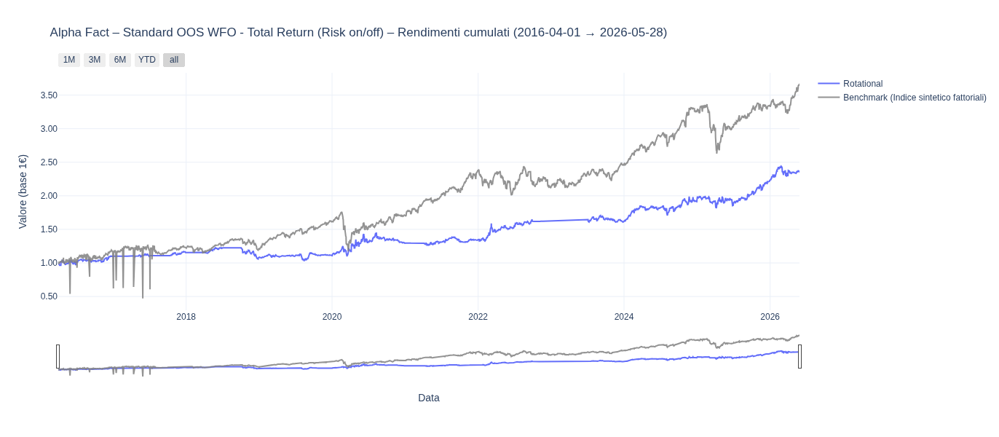


  Alpha Fact – Standard OOS WFO - Total Return (Risk on/off)

  Selezioni totali : 41
  Carry-forward    : 0 (0.0%)
  Selezioni vuote  : 0

  --- Stats Rotational ---


Start                         2016-04-01 00:00:00
End                           2026-05-28 00:00:00
Period                         2584 days 00:00:00
Start Value                              100000.0
End Value                           236183.821438
Total Return [%]                       136.183821
Benchmark Return [%]                   172.777678
Max Gross Exposure [%]                      100.0
Total Fees Paid                               0.0
Max Drawdown [%]                         16.08032
Max Drawdown Duration           396 days 00:00:00
Total Trades                                   38
Total Closed Trades                            37
Total Open Trades                               1
Open Trade PnL                        -259.057632
Win Rate [%]                            67.567568
Best Trade [%]                          12.390041
Worst Trade [%]                        -11.439527
Avg Winning Trade [%]                    4.677685
Avg Losing Trade [%]                    -2.143867



  --- Stats Benchmark (Indice sintetico fattoriali) ---


Start                         2016-04-01 00:00:00
End                           2026-05-28 00:00:00
Period                         2584 days 00:00:00
Start Value                              100000.0
End Value                           364827.562489
Total Return [%]                       264.827562
Benchmark Return [%]                   264.827562
Max Gross Exposure [%]                      100.0
Total Fees Paid                               0.0
Max Drawdown [%]                        62.657348
Max Drawdown Duration           339 days 00:00:00
Total Trades                                    1
Total Closed Trades                             0
Total Open Trades                               1
Open Trade PnL                      264827.562489
Win Rate [%]                                  NaN
Best Trade [%]                                NaN
Worst Trade [%]                               NaN
Avg Winning Trade [%]                         NaN
Avg Losing Trade [%]                          NaN



  --- Ultime selezioni ---


,tickers,carried,n_passed_filters,universe
rebal_date,,,,
2023-06-30,[IWQU.MI],False,8,"[IUSN.DE, IWMO.MI, IWQU.MI, IWVL.MI, XDEV.MI, ..."
2023-09-29,[IBTS.MI],False,8,"[IUSN.DE, IWMO.MI, IWQU.MI, IWVL.MI, XDEV.MI, ..."
2023-12-29,[IWQU.MI],False,8,"[IUSN.DE, IWMO.MI, IWQU.MI, IWVL.MI, XDEV.MI, ..."
2024-03-28,[IWVL.MI],False,8,"[IUSN.DE, IWMO.MI, IWQU.MI, IWVL.MI, XDEV.MI, ..."
2024-06-28,[IWQU.MI],False,8,"[IUSN.DE, IWMO.MI, IWQU.MI, IWVL.MI, XDEV.MI, ..."
2024-09-30,[XAD5.MI],False,8,"[IUSN.DE, IWMO.MI, IWQU.MI, IWVL.MI, XDEV.MI, ..."
2024-12-30,[IBTS.MI],False,8,"[IUSN.DE, IWMO.MI, IWQU.MI, IWVL.MI, XDEV.MI, ..."
2025-03-31,[XAD5.MI],False,8,"[IUSN.DE, IWMO.MI, IWQU.MI, IWVL.MI, XDEV.MI, ..."
2025-06-30,[IWMO.MI],False,8,"[IUSN.DE, IWMO.MI, IWQU.MI, IWVL.MI, XDEV.MI, ..."


🛠️ Analisi Portfolio Rotazionale (Alpha Fact):



,Cumulative Return (%),Annualized Return (%),CAGR (%),Annualized Volatility (%),Sharpe Ratio,Sortino Ratio,Max Drawdown (%),Calmar Ratio,Win Rate (%),Avg Daily Return (%)
Indice sintetico fattoriali,264.83,48.76,13.59,95.24,0.51,0.76,62.66,0.22,56.33,0.19
Alpha Fact,136.18,9.15,8.83,12.37,0.74,0.89,16.08,0.55,49.75,0.04


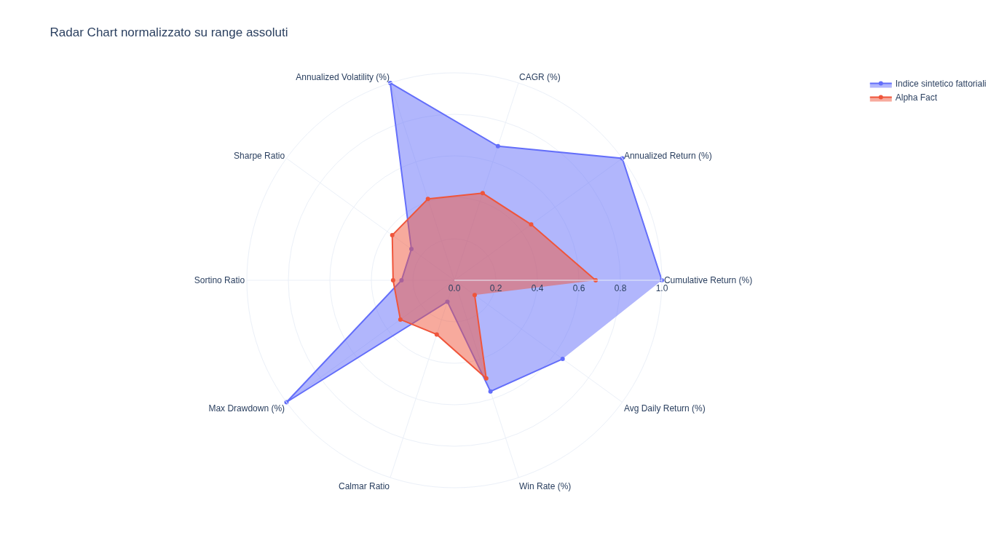


▶ Portafoglio SENZA Risk ON/OFF...


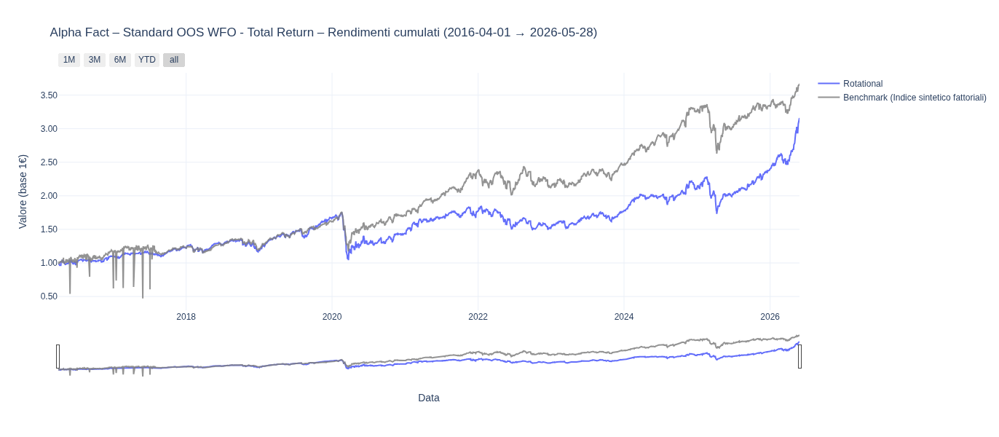


  Alpha Fact – Standard OOS WFO - Total Return

  Selezioni totali : 41
  Carry-forward    : 0 (0.0%)
  Selezioni vuote  : 0

  --- Stats Rotational ---


Start                                2016-04-01 00:00:00
End                                  2026-05-28 00:00:00
Period                                2583 days 00:00:00
Start Value                                     100000.0
End Value                                  315960.291816
Total Return [%]                              215.960292
Benchmark Return [%]                          221.604415
Max Gross Exposure [%]                             100.0
Total Fees Paid                                      0.0
Max Drawdown [%]                               40.227762
Max Drawdown Duration                  517 days 00:00:00
Total Trades                                          36
Total Closed Trades                                   35
Total Open Trades                                      1
Open Trade PnL                              61818.305306
Win Rate [%]                                        80.0
Best Trade [%]                                 19.127087
Worst Trade [%]                


  --- Stats Benchmark (Indice sintetico fattoriali) ---


Start                         2016-04-01 00:00:00
End                           2026-05-28 00:00:00
Period                         2583 days 00:00:00
Start Value                              100000.0
End Value                           364827.562489
Total Return [%]                       264.827562
Benchmark Return [%]                   264.827562
Max Gross Exposure [%]                      100.0
Total Fees Paid                               0.0
Max Drawdown [%]                        62.657348
Max Drawdown Duration           339 days 00:00:00
Total Trades                                    1
Total Closed Trades                             0
Total Open Trades                               1
Open Trade PnL                      264827.562489
Win Rate [%]                                  NaN
Best Trade [%]                                NaN
Worst Trade [%]                               NaN
Avg Winning Trade [%]                         NaN
Avg Losing Trade [%]                          NaN



  --- Ultime selezioni ---


,tickers,carried,n_passed_filters,universe
rebal_date,,,,
2023-06-30,[IWQU.MI],False,5,"[IUSN.DE, IWMO.MI, IWQU.MI, IWVL.MI, XDEV.MI]"
2023-09-29,[IWVL.MI],False,5,"[IUSN.DE, IWMO.MI, IWQU.MI, IWVL.MI, XDEV.MI]"
2023-12-29,[IWQU.MI],False,5,"[IUSN.DE, IWMO.MI, IWQU.MI, IWVL.MI, XDEV.MI]"
2024-03-28,[IWVL.MI],False,5,"[IUSN.DE, IWMO.MI, IWQU.MI, IWVL.MI, XDEV.MI]"
2024-06-28,[IWQU.MI],False,5,"[IUSN.DE, IWMO.MI, IWQU.MI, IWVL.MI, XDEV.MI]"
2024-09-30,[IUSN.DE],False,5,"[IUSN.DE, IWMO.MI, IWQU.MI, IWVL.MI, XDEV.MI]"
2024-12-30,[IWMO.MI],False,5,"[IUSN.DE, IWMO.MI, IWQU.MI, IWVL.MI, XDEV.MI]"
2025-03-31,[XDEV.MI],False,5,"[IUSN.DE, IWMO.MI, IWQU.MI, IWVL.MI, XDEV.MI]"
2025-06-30,[IWMO.MI],False,5,"[IUSN.DE, IWMO.MI, IWQU.MI, IWVL.MI, XDEV.MI]"


🛠️ Analisi Portfolio Rotazionale (Alpha Fact (Base)):



,Cumulative Return (%),Annualized Return (%),CAGR (%),Annualized Volatility (%),Sharpe Ratio,Sortino Ratio,Max Drawdown (%),Calmar Ratio,Win Rate (%),Avg Daily Return (%)
Indice sintetico fattoriali,264.83,48.78,13.59,95.26,0.51,0.76,62.66,0.22,56.31,0.19
Alpha Fact,215.96,12.59,12.00,16.46,0.76,0.90,40.23,0.30,52.63,0.05


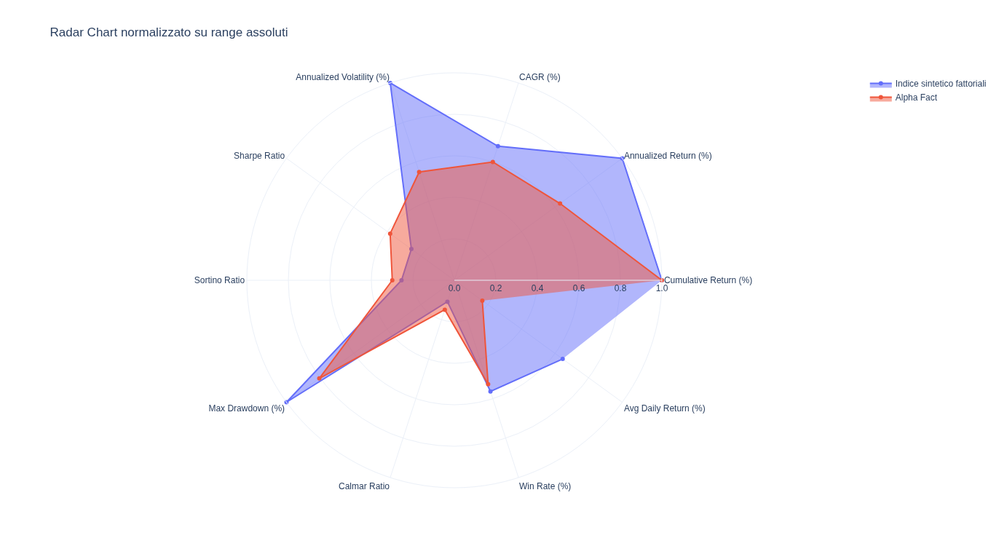


▶ Confronto selezioni Risk ON/OFF vs Base...


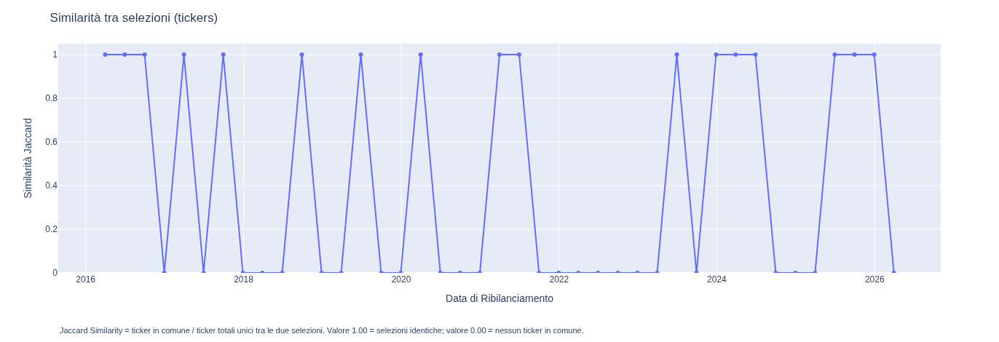

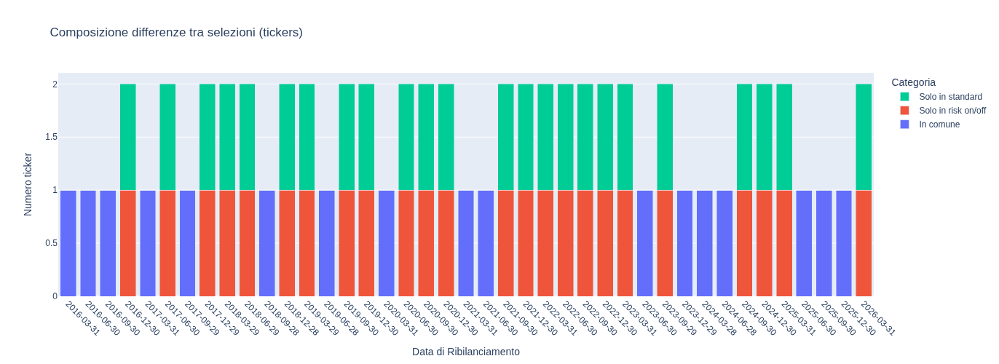

Confronto selezioni tickers



PIPELINE COMPLETATA


In [25]:
ratio_int = int(str(ratio).split(':')[0])
benchmark_start    = benchmark_data.dropna(how='all').index.min()
first_full_year    = pd.Timestamp(f"{benchmark_start.year + 1}-01-01")
pipeline_start_date = first_full_year - pd.DateOffset(years=ratio_int)

print(f"Benchmark start:         {benchmark_start.date()}")
print(f"Primo anno pieno comune: {first_full_year.date()}")
print(f"Pipeline start:          {pipeline_start_date.date()}")
print(f"Primo OOS atteso:        {first_full_year.date()}")


results_std = run_wfo_pipeline(
    # Dati
    stocks_data_raw        = stocks_data_raw,
    stocks_data            = stocks_data,
    benchmark_data         = benchmark_data,
    benchmark_data_raw     = benchmark_data_raw,
    tickers                = tickers,
    risk_off_data          = risk_off_data,
    # Parametri WFO
    ratio                  = ratio,
    metric                 = metric,
    start_date             = pipeline_start_date,
    end_date               = end_date,
    cores                  = cores,
    verbose                = verbose,
    force_next_year_params = force_next_year_params,
    use_clustering         = False,
    param_grid             = reduced_grid,   # stability-reduced
    # Parametri portafoglio
    portfolio_title        = portfolio_title,
    benchmark_title        = benchmark_title,
    init_cash              = init_cash,
    risk_on_off            = True,
    plot                   = True,
)



In [26]:
# Accesso ai risultati
pf_rot_std           = results_std['pf_rot']           # con Risk ON/OFF
pf_rot_std_base      = results_std['pf_rot_base']      # senza Risk ON/OFF
regime               = results_std['regime']
summary_df_std       = results_std['summary_df']
sel_tickers_std      = results_std['sel_tickers']      # con Risk ON/OFF
sel_tickers_std_base = results_std['sel_tickers_base'] # senza Risk ON/OFF

# Verifica colonna universe (pre-condizione MC skill tests)
assert 'universe' in sel_tickers_std_base.columns, "Colonna 'universe' mancante in sel_tickers_std_base"
assert sel_tickers_std_base['universe'].apply(len).min() > 0
print(f"sel_tickers_std_base: {len(sel_tickers_std_base)} righe, universe OK")

sel_tickers_std_base: 41 righe, universe OK


In [27]:
# df_compare = compare_selection_columns(
#     sel_tickers_std,
#     sel_tickers_std_base,
#     column="tickers",
#     label_a="risk on/off",
#     label_b="standard",
#     compare_only_common_dates=True,
#     sort_table_by_diff=True
# )

In [28]:
# Salva WFO Standard
save_rotational_wfo_summary(
    summary_df             = summary_df_std,
    start_date             = start_date,
    end_date               = end_date,
    file_path              = wfo_file_save,
    param_grid             = reduced_grid,
    metric                 = metric,
    ratio                  = ratio,
    force_next_year_params = force_next_year_params,
    extra_meta             = None,
)

[WFO SAVE OK] File salvato correttamente: '../../outputs/WFO_R_DEV_RESULTS/Alpha Fact_2026.wfo_summary.csv' | Righe: 12 | Metric: Sharpe Ratio | Ratio: 3:1 | Data start: 2015-01-01 | Data end: None | Force next year params: True


### §5b — WFO Clusterizzata

**Nota**: usa `build_cluster_grids` internamente — la `reduced_grid` della stability
non viene applicata. I flag binari variano liberamente per cluster
(debito metodologico, vedere CLAUDE.md).

corr_threshold: rescaling non convergito dopo 5 iter, fallback su silhouette



STEP 1 — Analisi e clustering universo
  K adattivo proposto: 2 (metodo=hybrid→silhouette, score=0.275)
  K massimo ammesso: 2 (universe_size=5, min_cluster_size=4)
  ⚠️ Nessun K rispetta min_cluster_size=4. Fallback a K=2.
  K finale usato: 2

Soglie adattive universo:
  Vol p33=15.2%  p66=16.3%
  Mom6m mediana=26.5%
  Sharpe mediana=1.13

Cluster 1 [BALANCED] — 2 asset
  Tickers  : ['IWVL.MI', 'XDEV.MI']
  Avg Vol  : 15.2%
  Avg Mom6m: 42.4%
  Avg MaxDD: -17.8%
  Sharpe   : 2.19

Cluster 2 [BALANCED] — 3 asset
  Tickers  : ['IWQU.MI', 'IWMO.MI', 'IUSN.DE']
  Avg Vol  : 16.7%
  Avg Mom6m: 19.6%
  Avg MaxDD: -22.8%
  Sharpe   : 1.00

⚠️  Tutti i cluster hanno label 'BALANCED' — forzo differenziazione per Sharpe
  Cluster 1 → DEFENSIVE (Sharpe=2.19)
  Cluster 2 → BALANCED (Sharpe=1.00)


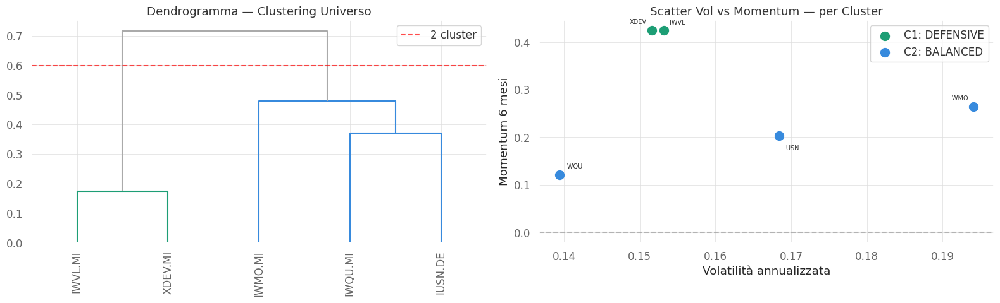


Soglie adattive universo:
  Vol p33=15.2%  p66=16.3%
  Mom6m mediana=26.5%
  Sharpe mediana=1.13

Cluster 1 [BALANCED] — 2 asset
  Tickers  : ['IWVL.MI', 'XDEV.MI']
  Avg Vol  : 15.2%
  Avg Mom6m: 42.4%
  Avg MaxDD: -17.8%
  Sharpe   : 2.19

Cluster 2 [BALANCED] — 3 asset
  Tickers  : ['IWQU.MI', 'IWMO.MI', 'IUSN.DE']
  Avg Vol  : 16.7%
  Avg Mom6m: 19.6%
  Avg MaxDD: -22.8%
  Sharpe   : 1.00

⚠️  Tutti i cluster hanno label 'BALANCED' — forzo differenziazione per Sharpe
  Cluster 1 → DEFENSIVE (Sharpe=2.19)
  Cluster 2 → BALANCED (Sharpe=1.00)


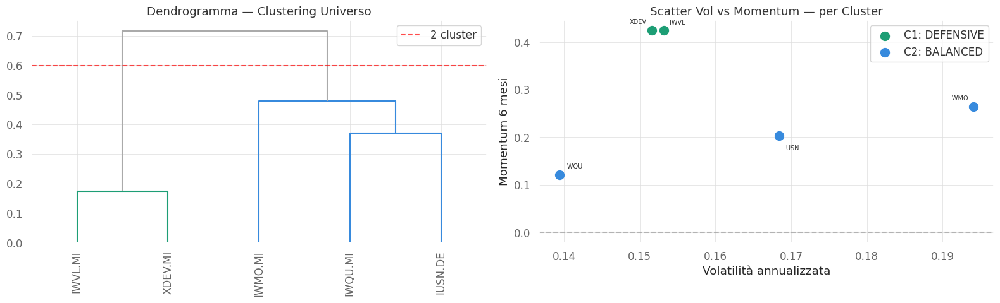

/tmp/ipykernel_6506/1375377357.py:610: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



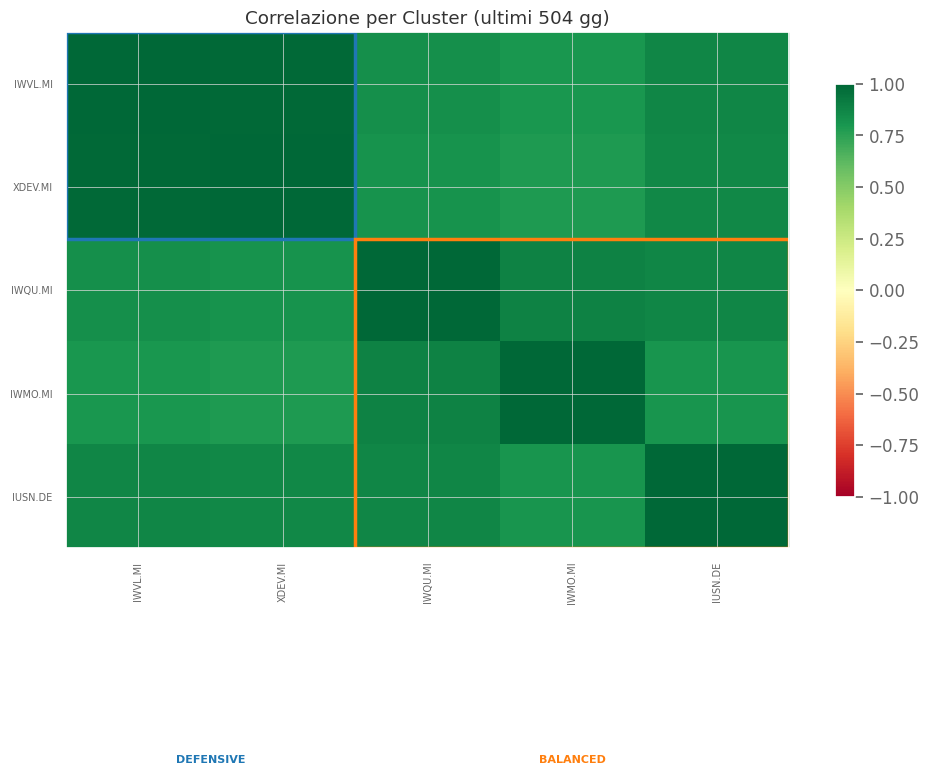


STEP 2 — Griglie WFO per cluster

Cluster 1 [DEFENSIVE] — 2 asset → n_top: [2, 3]
  Combinazioni totali: 192

Cluster 2 [BALANCED] — 3 asset → n_top: [2, 3]
  Combinazioni totali: 768

STEP 3 — WFO per cluster

WFO Cluster 1 [DEFENSIVE] — 2 asset
Tickers: ['IWVL.MI', 'XDEV.MI']


WFO Parallel:   0%|          | 0/12 [00:00<?, ?it/s]

✅ Cluster 1 — WFO completata
   TrainScore medio: 0.6639
   TestScore medio : 1.3495
WFO Results Cluster 1 [DEFENSIVE]



WFO Cluster 2 [BALANCED] — 3 asset
Tickers: ['IWQU.MI', 'IWMO.MI', 'IUSN.DE']


WFO Parallel:   0%|          | 0/12 [00:00<?, ?it/s]

/home/luca/PEnv/Investia-3.12/lib/python3.12/site-packages/joblib/externals/loky/process_executor.py:752: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



✅ Cluster 2 — WFO completata
   TrainScore medio: 0.9669
   TestScore medio : 1.0099
WFO Results Cluster 2 [BALANCED]


WFO Results Cluster 1 [DEFENSIVE]


WFO Results Cluster 2 [BALANCED]



STEP 4 — Regime Risk ON/OFF
⚠️  Nessun ticker 'HIGH_MOMENTUM' — uso tutti
Regime ON : 71.0% del tempo
Regime OFF: 29.0% del tempo

STEP 5 — Merge summary_df aggregato
⚠️  Cluster 'HIGH_MOMENTUM' non trovato, disponibili: ['DEFENSIVE', 'BALANCED']
   → Fallback su 'BALANCED'

SUMMARY DF AGGREGATO
Finestre totali : 12
Risk ON  → BALANCED         : 10 finestre
Risk OFF → DEFENSIVE        : 2 finestre
WFO Results Clustered — Alpha Fact



STEP 6 — Costruzione portafogli

▶ Portafoglio CON Risk ON/OFF...


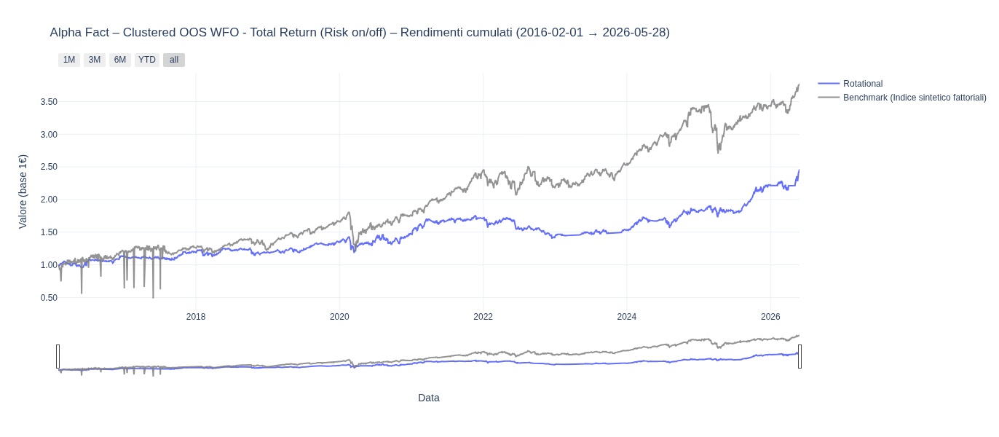


  Alpha Fact – Clustered OOS WFO - Total Return (Risk on/off)

  Selezioni totali : 125
  Carry-forward    : 14 (11.2%)
  Selezioni vuote  : 0
  Date carry-fwd   : [datetime.date(2016, 5, 31), datetime.date(2017, 1, 31), datetime.date(2017, 6, 30), datetime.date(2017, 7, 31), datetime.date(2017, 8, 31)]...

  --- Stats Rotational ---


Start                                2016-02-01 00:00:00
End                                  2026-05-28 00:00:00
Period                                2626 days 00:00:00
Start Value                                     100000.0
End Value                                  246147.586838
Total Return [%]                              146.147587
Benchmark Return [%]                          175.681814
Max Gross Exposure [%]                             100.0
Total Fees Paid                                      0.0
Max Drawdown [%]                               19.882556
Max Drawdown Duration                  731 days 00:00:00
Total Trades                                        1738
Total Closed Trades                                 1736
Total Open Trades                                      2
Open Trade PnL                              24756.885269
Win Rate [%]                                    68.43318
Best Trade [%]                                 25.234327
Worst Trade [%]                


  --- Stats Benchmark (Indice sintetico fattoriali) ---


Start                         2016-02-01 00:00:00
End                           2026-05-28 00:00:00
Period                         2626 days 00:00:00
Start Value                              100000.0
End Value                           375286.691221
Total Return [%]                       275.286691
Benchmark Return [%]                   275.286691
Max Gross Exposure [%]                      100.0
Total Fees Paid                               0.0
Max Drawdown [%]                        62.657348
Max Drawdown Duration           339 days 00:00:00
Total Trades                                    1
Total Closed Trades                             0
Total Open Trades                               1
Open Trade PnL                      275286.691221
Win Rate [%]                                  NaN
Best Trade [%]                                NaN
Worst Trade [%]                               NaN
Avg Winning Trade [%]                         NaN
Avg Losing Trade [%]                          NaN



  --- Ultime selezioni ---


,tickers,carried,n_passed_filters,universe
rebal_date,,,,
2025-06-30,"[XAD5.MI, XEON.MI]",True,0,[]
2025-07-31,"[XDEV.MI, IWVL.MI]",False,4,"[IWMO.MI, IWQU.MI, IWVL.MI, XDEV.MI]"
2025-08-29,"[XAD5.MI, IWVL.MI]",False,3,"[IWVL.MI, XAD5.MI, XEON.MI]"
2025-09-30,"[XAD5.MI, IWVL.MI]",False,4,"[IWQU.MI, IWVL.MI, XDEV.MI, XAD5.MI]"
2025-10-31,"[XDEV.MI, IWVL.MI]",False,6,"[IWMO.MI, IWQU.MI, IWVL.MI, XDEV.MI, IBTS.MI, ..."
2025-11-28,[IUSN.DE],False,1,[IUSN.DE]
2025-12-30,[XEON.MI],False,1,[XEON.MI]
2026-01-30,"[IWVL.MI, XDEV.MI]",False,3,"[IWVL.MI, XDEV.MI, XEON.MI]"
2026-02-27,"[XDEV.MI, IWVL.MI]",False,4,"[IWQU.MI, IWVL.MI, XDEV.MI, XEON.MI]"


🛠️ Analisi Portfolio Rotazionale (Alpha Fact):



,Cumulative Return (%),Annualized Return (%),CAGR (%),Annualized Volatility (%),Sharpe Ratio,Sortino Ratio,Max Drawdown (%),Calmar Ratio,Win Rate (%),Avg Daily Return (%)
Indice sintetico fattoriali,275.29,48.98,13.67,95.27,0.51,0.76,62.66,0.22,56.23,0.19
Alpha Fact,146.15,9.37,9.12,12.00,0.78,0.98,19.88,0.46,54.10,0.04


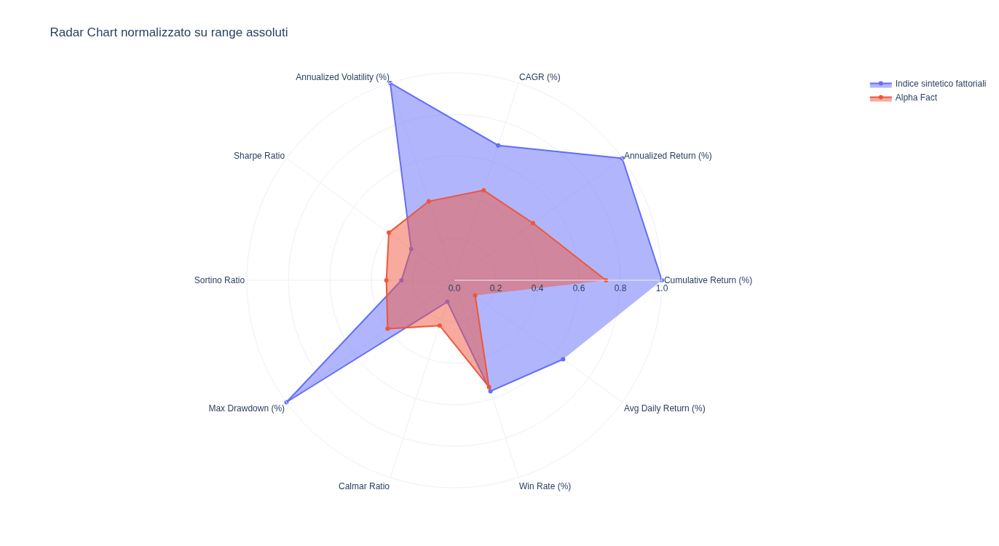


▶ Portafoglio SENZA Risk ON/OFF...


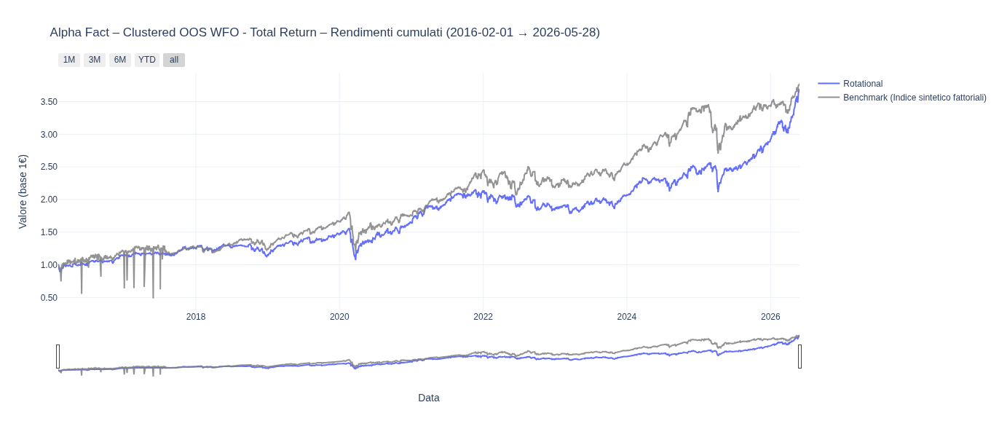


  Alpha Fact – Clustered OOS WFO - Total Return

  Selezioni totali : 125
  Carry-forward    : 44 (35.2%)
  Selezioni vuote  : 0
  Date carry-fwd   : [datetime.date(2016, 1, 29), datetime.date(2016, 2, 29), datetime.date(2016, 5, 31), datetime.date(2016, 8, 31), datetime.date(2016, 12, 30)]...

  --- Stats Rotational ---


Start                                2016-02-01 00:00:00
End                                  2026-05-28 00:00:00
Period                                2620 days 00:00:00
Start Value                                     100000.0
End Value                                  369593.169222
Total Return [%]                              269.593169
Benchmark Return [%]                          225.134816
Max Gross Exposure [%]                             100.0
Total Fees Paid                                      0.0
Max Drawdown [%]                               31.495475
Max Drawdown Duration                  563 days 00:00:00
Total Trades                                        1733
Total Closed Trades                                 1731
Total Open Trades                                      2
Open Trade PnL                              63255.386351
Win Rate [%]                                   66.262276
Best Trade [%]                                 44.851415
Worst Trade [%]                


  --- Stats Benchmark (Indice sintetico fattoriali) ---


Start                         2016-02-01 00:00:00
End                           2026-05-28 00:00:00
Period                         2620 days 00:00:00
Start Value                              100000.0
End Value                           375286.691221
Total Return [%]                       275.286691
Benchmark Return [%]                   275.286691
Max Gross Exposure [%]                      100.0
Total Fees Paid                               0.0
Max Drawdown [%]                        62.657348
Max Drawdown Duration           339 days 00:00:00
Total Trades                                    1
Total Closed Trades                             0
Total Open Trades                               1
Open Trade PnL                      275286.691221
Win Rate [%]                                  NaN
Best Trade [%]                                NaN
Worst Trade [%]                               NaN
Avg Winning Trade [%]                         NaN
Avg Losing Trade [%]                          NaN



  --- Ultime selezioni ---


,tickers,carried,n_passed_filters,universe
rebal_date,,,,
2025-06-30,"[IWVL.MI, XDEV.MI]",True,0,[]
2025-07-31,"[IWVL.MI, IWQU.MI]",False,3,"[IWMO.MI, IWQU.MI, IWVL.MI]"
2025-08-29,[IWVL.MI],False,1,[IWVL.MI]
2025-09-30,"[IWVL.MI, XDEV.MI]",False,3,"[IWQU.MI, IWVL.MI, XDEV.MI]"
2025-10-31,"[XDEV.MI, IWVL.MI]",False,3,"[IWQU.MI, IWVL.MI, XDEV.MI]"
2025-11-28,"[XDEV.MI, IWVL.MI]",True,0,[]
2025-12-30,"[XDEV.MI, IWVL.MI]",True,0,[]
2026-01-30,"[IWVL.MI, XDEV.MI]",False,2,"[IWVL.MI, XDEV.MI]"
2026-02-27,"[XDEV.MI, IWVL.MI]",False,3,"[IWQU.MI, IWVL.MI, XDEV.MI]"


🛠️ Analisi Portfolio Rotazionale (Alpha Fact (Base)):



,Cumulative Return (%),Annualized Return (%),CAGR (%),Annualized Volatility (%),Sharpe Ratio,Sortino Ratio,Max Drawdown (%),Calmar Ratio,Win Rate (%),Avg Daily Return (%)
Indice sintetico fattoriali,275.29,49.09,13.67,95.38,0.51,0.77,62.66,0.22,56.20,0.19
Alpha Fact,269.59,13.69,13.51,14.89,0.92,1.15,31.50,0.43,53.15,0.05


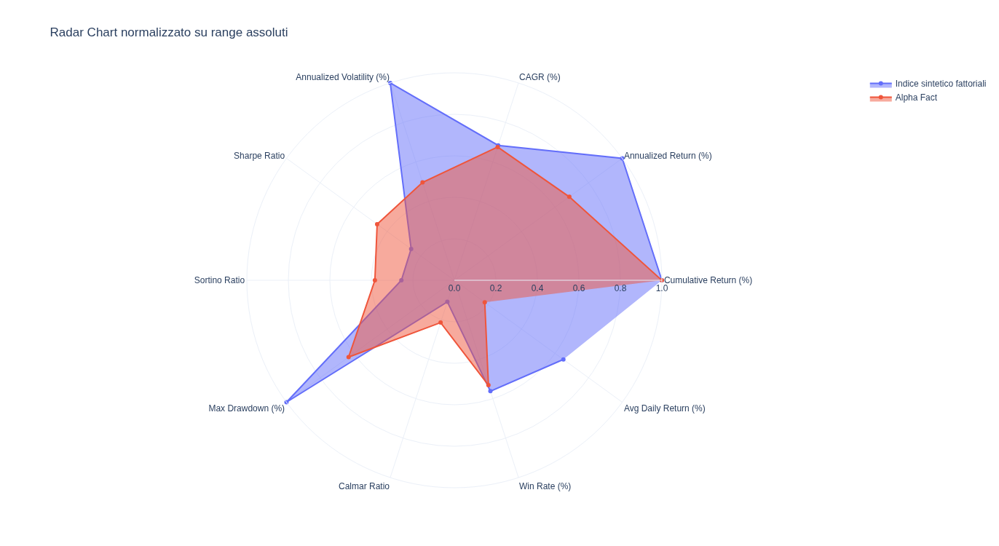


▶ Confronto selezioni Risk ON/OFF vs Base...


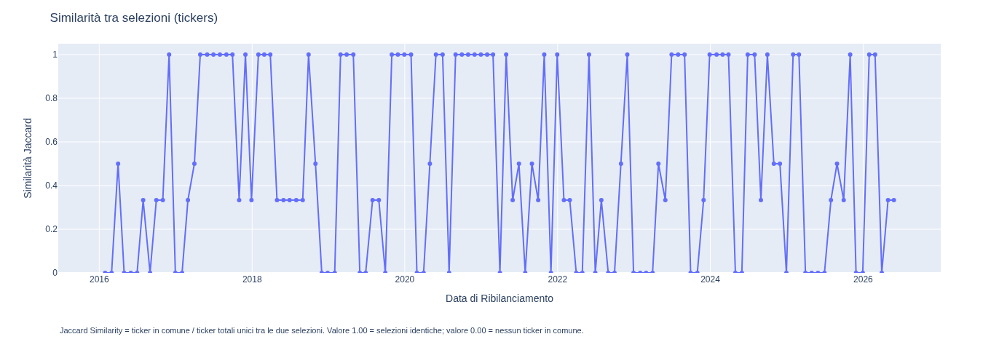

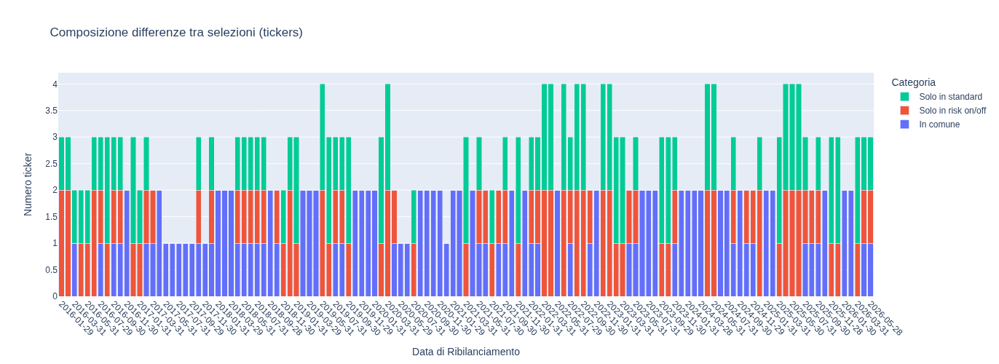

Confronto selezioni tickers



PIPELINE COMPLETATA


In [29]:
# Decommentare per portafogli con universo disomogeneo

use_clustering     = True
adaptive_k         = True
adaptive_k_method  = 'hybrid'
max_clusters       = 5
lookback_days      = 504
n_top_min          = 2
save_plots         = True

results_cluster = run_wfo_pipeline(
    # Dati
    stocks_data_raw    = stocks_data_raw,
    stocks_data        = stocks_data,
    benchmark_data     = benchmark_data,
    benchmark_data_raw = benchmark_data_raw,
    tickers            = tickers,
    risk_off_data      = risk_off_data,
    # Parametri WFO
    ratio              = ratio,
    metric             = metric,
    start_date         = pipeline_start_date,
    end_date           = end_date,
    cores              = cores,
    verbose            = verbose,
    force_next_year_params = force_next_year_params,
    # Parametri clustering
    use_clustering     = use_clustering,
    adaptive_k         = adaptive_k,
    adaptive_k_method  = adaptive_k_method,
    n_clusters         = max_clusters,
    lookback_days      = lookback_days,
    n_top_min          = n_top_min,
    # Parametri portafoglio
    portfolio_title    = portfolio_title,
    benchmark_title    = benchmark_title,
    init_cash          = init_cash,
    risk_on_off        = True,
    plot               = True,
    # Salvataggio plot
    save_plots         = save_plots,
    plots_dir          = plots_dir,
)

pf_rot_cluster           = results_cluster['pf_rot']
pf_rot_cluster_base      = results_cluster['pf_rot_base']
regime_cluster           = results_cluster['regime']
summary_df_cluster       = results_cluster['summary_df']
sel_tickers_cluster      = results_cluster['sel_tickers']
sel_tickers_cluster_base = results_cluster['sel_tickers_base']

# results_cluster = None   # placeholder se non eseguita

### §5c — Confronto WFO

Confronto metriche di performance Standard vs Clusterizzata.
Il confronto dei verdetti OFC (S1-S4) è in §6.

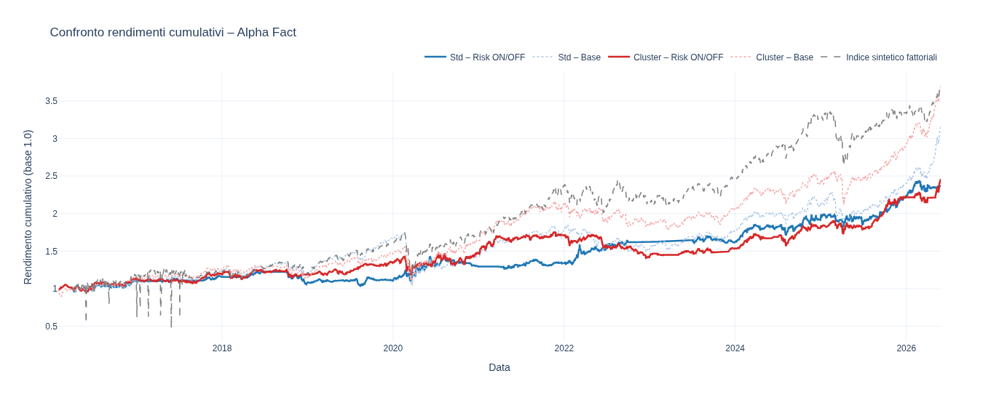

🛠️ Analisi Portfolio Rotazionale (Confronto WFO – Alpha Fact):



,Cumulative Return (%),Annualized Return (%),CAGR (%),Annualized Volatility (%),Sharpe Ratio,Sortino Ratio,Max Drawdown (%),Calmar Ratio,Win Rate (%),Avg Daily Return (%)
Benchmark,264.83,48.76,13.59,95.24,0.51,0.76,62.66,0.22,56.33,0.19
Cluster – Base,269.59,13.25,13.51,14.84,0.89,1.11,31.50,0.43,53.20,0.05
Std – Base,215.96,12.60,11.79,16.47,0.77,0.90,40.23,0.29,52.65,0.05
Cluster – Risk ON/OFF,146.15,9.37,9.12,12.00,0.78,0.98,19.88,0.46,54.10,0.04
Std – Risk ON/OFF,136.18,9.15,8.69,12.37,0.74,0.89,16.08,0.54,49.75,0.04


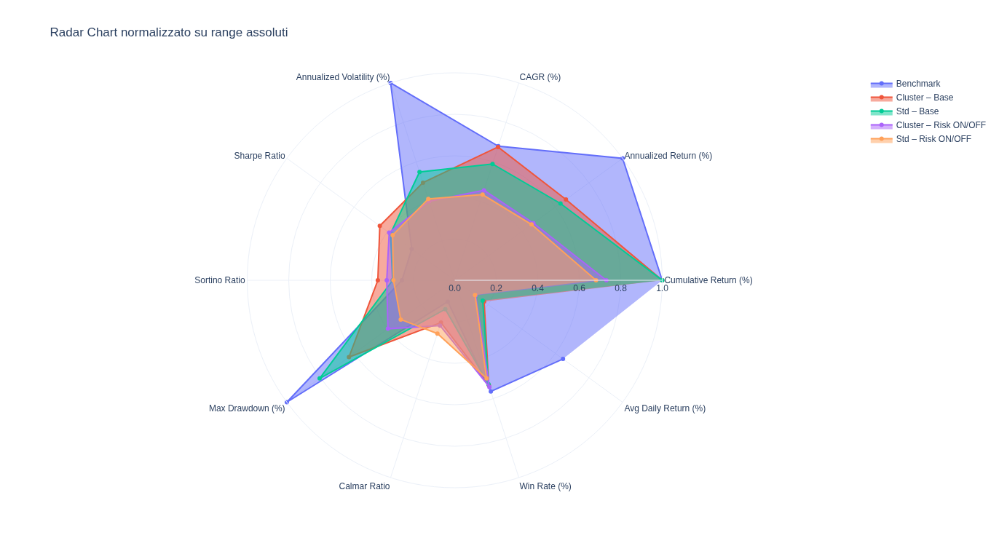

,Cumulative Return (%),Annualized Return (%),CAGR (%),Annualized Volatility (%),Sharpe Ratio,Sortino Ratio,Max Drawdown (%),Calmar Ratio,Win Rate (%),Avg Daily Return (%)
Benchmark,264.83,48.76,13.59,95.24,0.51,0.76,62.66,0.22,56.33,0.19
Cluster – Base,269.59,13.25,13.51,14.84,0.89,1.11,31.50,0.43,53.20,0.05
Std – Base,215.96,12.60,11.79,16.47,0.77,0.90,40.23,0.29,52.65,0.05
Cluster – Risk ON/OFF,146.15,9.37,9.12,12.00,0.78,0.98,19.88,0.46,54.10,0.04
Std – Risk ON/OFF,136.18,9.15,8.69,12.37,0.74,0.89,16.08,0.54,49.75,0.04


In [31]:
if results_cluster is not None:
    metrics_df = compare_wfo_pipelines(
        results_std     = results_std,
        results_cluster = results_cluster,
        portfolio_title = portfolio_title,
        benchmark_title = benchmark_title,
        plot_radar      = True,
        save_plots      = True,
        plots_dir       = plots_dir,
    )
    display(metrics_df)
else:
    print("WFO Clusterizzata non eseguita — confronto non disponibile.")

## §6 — Overfitting Check

Valuta 4 segnali di overfitting (S1 plateau, S2 coerenza flag,
S3 cross-sectional skill, S4 DSR). Verdetti separati per Standard e Cluster.
Vedi CLAUDE.md "Interpretation framework: Reshuffle vs S3".

In [32]:
import json
import itertools
from pathlib import Path

# --- OFC Standard ---
ofc_passed_std, ofc_report_std = overfitting_check_rotational(
    wfo_summary      = summary_df_std,
    stocks_data      = stocks_data,
    benchmark_data   = benchmark_data,
    param_grid       = reduced_grid,
    profile          = profile,
    n_total_trials   = n_full_trials,     # penalizzazione conservativa: full grid
    stability_report = stability_report,
    seed             = 42,
    verbose          = True,
)

# Salva ofc_report come JSON (audit trail; caricabile in §10 senza re-run)
ofc_report_path = f"data/ofc_reports/{portfolio_title}_{year}_std.json"
Path(ofc_report_path).parent.mkdir(parents=True, exist_ok=True)
with open(ofc_report_path, "w") as f:
    json.dump(ofc_report_std, f, default=str, indent=2)
print(f"OFC report std salvato: {ofc_report_path}")
print(f"OFC Standard — promoted={ofc_passed_std}")

OFC Bootstrap:   0%|          | 0/1000 [00:00<?, ?it/s]


  Overfitting Check — profile='satellite'  metric(S3)=CAGR
  n_trials(S4)=6144  OOS windows=12
  Signal           Pass?      Value  Note (truncated)
  --------------------------------------------------------------
  S1 plateau        PASS    +0.6458  S1: diversity=0.646 >threshold=0.20? params=['momentum_
  S2 coherence      FAIL    +0.2500  S2: 1/4 coherent=0.25 >=threshold=0.50 (source: stabili
  S3 bootstrap      FAIL    +0.7700  S3 (CAGR): actual=0.0955, p=0.770 <=threshold=0.10, n=1
  S4 DSR            PASS    +0.5607  S4 (DSR on Sharpe): SR=0.6306, n=6144, T=2638, DSR=0.56
  ──────────────────────────────────────────────────────────────
  Signals: 2/4 (need 3)
  Verdict: NOT PROMOTED ✗

OFC report std salvato: data/ofc_reports/Alpha Fact_2026_std.json
OFC Standard — promoted=False


In [33]:
# --- OFC Cluster (solo se WFO Clusterizzata è stata eseguita) ---
if 'results_cluster' in locals() and results_cluster is not None:
    ofc_passed_cluster, ofc_report_cluster = overfitting_check_rotational(
        wfo_summary      = summary_df_cluster,
        stocks_data      = stocks_data,
        benchmark_data   = benchmark_data,
        param_grid       = full_grid,       # cluster usa full_grid (no stability)
        profile          = profile,
        n_total_trials   = n_full_trials,
        seed             = 42,
        verbose          = True,
    )
    ofc_report_cluster_path = f"data/ofc_reports/{portfolio_title}_{year}_cluster.json"
    Path(ofc_report_cluster_path).parent.mkdir(parents=True, exist_ok=True)
    with open(ofc_report_cluster_path, "w") as f:
        json.dump(ofc_report_cluster, f, default=str, indent=2)
    print(f"OFC report cluster salvato: {ofc_report_cluster_path}")
    print(f"OFC Cluster — promoted={ofc_passed_cluster}")

    # Tabella comparativa OFC Standard vs Cluster
    print("\n=== Confronto OFC Standard vs Cluster ===")
    for sig in ['s1_plateau', 's2_coherence', 's3_random_selection', 's4_dsr']:
        v_std = ofc_report_std.get(sig, {}).get('passed', '?')
        v_clu = ofc_report_cluster.get(sig, {}).get('passed', '?')
        print(f"  {sig:25s}  STD={'PASS' if v_std else 'FAIL'}  CLU={'PASS' if v_clu else 'FAIL'}")
    print(f"  {'Overall':25s}  STD={'PASS' if ofc_passed_std else 'FAIL'}  "
          f"CLU={'PASS' if ofc_passed_cluster else 'FAIL'}")
else:
    ofc_passed_cluster = None
    ofc_report_cluster = None
    print("WFO Clusterizzata non eseguita — OFC Cluster non disponibile.")

OFC Bootstrap:   0%|          | 0/1000 [00:00<?, ?it/s]


  Overfitting Check — profile='satellite'  metric(S3)=CAGR
  n_trials(S4)=6144  OOS windows=12
  Signal           Pass?      Value  Note (truncated)
  --------------------------------------------------------------
  S1 plateau        PASS    +0.6667  S1: diversity=0.667 >threshold=0.20? params=['momentum_
  S2 coherence      PASS    +1.0000  S2: 4/4 coherent=1.00 >=threshold=0.50 (source: wfo_sum
  S3 bootstrap      FAIL    +0.1590  S3 (CAGR): actual=0.1261, p=0.159 <=threshold=0.10, n=1
  S4 DSR            PASS    +0.8020  S4 (DSR on Sharpe): SR=0.8720, n=6144, T=2638, DSR=0.80
  ──────────────────────────────────────────────────────────────
  Signals: 3/4 (need 3)
  Verdict: PROMOTED ✓

OFC report cluster salvato: data/ofc_reports/Alpha Fact_2026_cluster.json
OFC Cluster — promoted=True

=== Confronto OFC Standard vs Cluster ===
  s1_plateau                 STD=PASS  CLU=PASS
  s2_coherence               STD=PASS  CLU=PASS
  s3_random_selection        STD=PASS  CLU=PASS
  s4_dsr    

## §7 — MC (Monte Carlo Validation)

In [34]:

from pathlib import Path

# Sub-directory per i plot dei due path (evita sovrascrittura)
plots_dir_std     = Path(plots_dir) / 'std'
plots_dir_cluster = Path(plots_dir) / 'cluster'
plots_dir_std.mkdir(parents=True, exist_ok=True)
plots_dir_cluster.mkdir(parents=True, exist_ok=True)

# Run completa (n=1000) con grafici — Path Standard
ci_results, ci_summary_df, skill_results, skill_summary_df = run_all_mc_methods_rotational(
    pf_rot              = pf_rot_std,
    pf_rot_base         = pf_rot_std_base,
    regime              = regime,
    sel_tickers         = sel_tickers_std,
    sel_tickers_base    = sel_tickers_std_base,
    stocks_data         = stocks_data,
    benchmark_data      = benchmark_data,
    tickers_master      = tickers,
    init_cash           = init_cash,
    n_simulations       = 1000,
    seed                = 42,
    block_size          = 10,
    vol_window          = 60,
    n_vol_quantiles     = 3,
    show_method_plots   = True,
    show_method_summaries = True,
    save_plots            = True,
    plots_dir             = plots_dir_std,   # ← sub-dir Standard
)

# Run completa (n=1000) con grafici — Path Cluster
if pf_rot_cluster is not None and pf_rot_cluster_base is not None:
    ci_results_cluster, ci_summary_df_cluster, skill_results_cluster, skill_summary_df_cluster = run_all_mc_methods_rotational(
        pf_rot              = pf_rot_cluster,
        pf_rot_base         = pf_rot_cluster_base,
        regime              = regime_cluster,
        sel_tickers         = sel_tickers_cluster,
        sel_tickers_base    = sel_tickers_cluster_base,
        stocks_data         = stocks_data,
        benchmark_data      = benchmark_data,
        tickers_master      = tickers,
        init_cash           = init_cash,
        n_simulations       = 1000,
        seed                = 42,
        block_size          = 10,
        vol_window          = 60,
        n_vol_quantiles     = 3,
        show_method_plots   = True,
        show_method_summaries = True,
        save_plots            = True,
        plots_dir             = plots_dir_cluster,   # ← sub-dir Cluster
    )
else:
    ci_results_cluster        = None
    ci_summary_df_cluster     = None
    skill_results_cluster     = None
    skill_summary_df_cluster  = None

Reference portfolios for MC validation
  Blocco A: pf_rot       (with Risk ON/OFF)  MC-CAGR=0.0874 | vbt-CAGR=0.1291
  Blocco B: pf_rot_base  (no Risk ON/OFF)    MC-CAGR=0.1188 | vbt-CAGR=0.1765
  Note: MC uses (V_end/V_start)^(252/n)-1  (academic convention).
        vbt uses an internal annualization that differs systematically.
        Compare MC-Actual vs MC distributions only; do NOT mix vbt and MC values.
BLOCCO A — Confidence Intervals

▶ A1 · IID Bootstrap ...
  [A1 sanity] median_CAGR=0.089  actual_CAGR=0.087  bias=+0.0020 (should be ≈ 0)

▶ A2 · Block Bootstrap ...
  [A2 sanity] std_CAGR=0.0356  (block_size=10; confronta con A1 — A2 dovrebbe avere std >= A1)

⚠  A3 (Regime-Conditional Block Bootstrap) skipped: regime=None (pipeline non-clustered). Use clustered pipeline to enable A3.

───────────────────────────────────────────────────────
CI Summary (p50 | Actual | Benchmark):

  A1 · IID Bootstrap
    CAGR        : p50=+0.089  actual=+0.087  bm=+0.135  actual_pct=48%
    Ma


  [SRI/PRIIPs Cat.3]  IID=3  Block=3  Final=3  (T_eff=5.0y  capital=10,000 EUR)
BLOCCO B — Skill Tests (p-value)

▶ B1 · Rotation Reshuffle ...

▶ B2 · Rebalance Timing Bootstrap ...

───────────────────────────────────────────────────────
Skill Test Summary (p-value per metrica):

  B1 · Rotation Reshuffle
  → Selection skill: NOT significant (p_CAGR=0.583)
    CAGR        : p=0.583     actual=+0.119
    MaxDD       : p=0.852     actual=-0.402
    Sharpe      : p=0.613     actual=+0.765
    Calmar      : p=0.803     actual=+0.295

  B2 · Rebalance Timing
  → Timing skill: NOT significant (p_CAGR=0.554)
    CAGR        : p=0.554     actual=+0.119
    MaxDD       : p=0.905     actual=-0.402
    Sharpe      : p=0.638     actual=+0.765
    Calmar      : p=0.799     actual=+0.295


Reference portfolios for MC validation
  Blocco A: pf_rot       (with Risk ON/OFF)  MC-CAGR=0.0903 | vbt-CAGR=0.1334
  Blocco B: pf_rot_base  (no Risk ON/OFF)    MC-CAGR=0.1340 | vbt-CAGR=0.1998
  Note: MC uses (V_end/V_start)^(252/n)-1  (academic convention).
        vbt uses an internal annualization that differs systematically.
        Compare MC-Actual vs MC distributions only; do NOT mix vbt and MC values.
BLOCCO A — Confidence Intervals

▶ A1 · IID Bootstrap ...
  [A1 sanity] median_CAGR=0.092  actual_CAGR=0.090  bias=+0.0021 (should be ≈ 0)

▶ A2 · Block Bootstrap ...
  [A2 sanity] std_CAGR=0.0381  (block_size=10; confronta con A1 — A2 dovrebbe avere std >= A1)

▶ A3 · Regime-Conditional Block Bootstrap ...
  [A3 sanity] hist_risk_off=27.28%  risk_on=72.72%  (frazioni preservate per costruzione)  fallback_used=False
  [A3 sanity] abs(diff) OFF frac = 0.000 (garantito dall'algoritmo)

───────────────────────────────────────────────────────
CI Summary (p50 | Actual | Benchmark):




  [SRI/PRIIPs Cat.3]  IID=3  Block=3  Final=3  (T_eff=5.0y  capital=10,000 EUR)
BLOCCO B — Skill Tests (p-value)

▶ B1 · Rotation Reshuffle ...

▶ B2 · Rebalance Timing Bootstrap ...

───────────────────────────────────────────────────────
Skill Test Summary (p-value per metrica):

  B1 · Rotation Reshuffle
  → Selection skill: SIGNIFICANT (p_CAGR=0.000, p_Sharpe=0.000, p_Calmar=0.000)
    CAGR        : p=0.000***  actual=+0.134
    MaxDD       : p=1.000     actual=-0.315
    Sharpe      : p=0.000***  actual=+0.920
    Calmar      : p=0.000***  actual=+0.425

  B2 · Rebalance Timing
  → Timing skill: NOT significant (p_CAGR=0.333)
    CAGR        : p=0.333     actual=+0.134
    MaxDD       : p=0.308     actual=-0.315
    Sharpe      : p=0.271     actual=+0.920
    Calmar      : p=0.273     actual=+0.425

⚠  Distribution shape warnings (Blocco B):
    B2 · Rebalance Timing:
      - MaxDD: distribuzione 3-modale rilevata (skewness=-0.61, kurtosis=-0.76); lettura del p-value richiede cau

In [35]:
display(ci_summary_df)
display(skill_summary_df)
display(ci_summary_df_cluster)
display(skill_summary_df_cluster)

,CAGR_p5,MaxDD_p5,Sharpe_p5,Calmar_p5,Volatility_p5,Ulcer_p5,CAGR_p25,MaxDD_p25,Sharpe_p25,Calmar_p25,...,Benchmark_Sharpe,Benchmark_Calmar,Benchmark_Volatility,Benchmark_Ulcer,Actual_base_CAGR,Actual_base_MaxDD,Actual_base_Sharpe,Actual_base_Calmar,Actual_base_Volatility,Actual_base_Ulcer
Method,,,,,,,,,,,,,,,,,,,,,
A1 · IID Bootstrap,0.023777,-0.347009,0.253854,0.078409,0.116530,-0.154057,0.062488,-0.263904,0.554681,0.249309,...,0.511872,0.21471,0.952589,-0.068898,0.11878,-0.402278,0.764717,0.295268,0.164666,-0.097998
A2 · Block Bootstrap,0.032876,-0.293150,0.325798,0.126622,0.112341,-0.129398,0.064161,-0.225239,0.567527,0.296762,...,0.511872,0.21471,0.952589,-0.068898,0.11878,-0.402278,0.764717,0.295268,0.164666,-0.097998


,p_value_CAGR,p_value_MaxDD,p_value_Sharpe,p_value_Calmar,p_value_Volatility,p_value_Ulcer,Actual_CAGR,Actual_MaxDD,Actual_Sharpe,Actual_Calmar,Actual_Volatility,Actual_Ulcer,interpretation
Test,,,,,,,,,,,,,
B1 · Rotation Reshuffle,0.583,0.852,0.613,0.803,0.726,0.957,0.11878,-0.402278,0.764717,0.295268,0.164666,-0.097998,Selection skill: NOT significant (p_CAGR=0.583)
B2 · Rebalance Timing,0.554,0.905,0.638,0.799,0.956,0.944,0.11878,-0.402278,0.764717,0.295268,0.164666,-0.097998,Timing skill: NOT significant (p_CAGR=0.554)


,CAGR_p5,MaxDD_p5,Sharpe_p5,Calmar_p5,Volatility_p5,Ulcer_p5,CAGR_p25,MaxDD_p25,Sharpe_p25,Calmar_p25,...,Benchmark_Sharpe,Benchmark_Calmar,Benchmark_Volatility,Benchmark_Ulcer,Actual_base_CAGR,Actual_base_MaxDD,Actual_base_Sharpe,Actual_base_Calmar,Actual_base_Volatility,Actual_base_Ulcer
Method,,,,,,,,,,,,,,,,,,,,,
A1 · IID Bootstrap,0.028159,-0.343788,0.292307,0.093727,0.114145,-0.155585,0.065829,-0.254796,0.587925,0.277526,...,0.514005,0.215967,0.952895,-0.068696,0.13398,-0.314955,0.919646,0.425395,0.148883,-0.061653
A2 · Block Bootstrap,0.025553,-0.337483,0.266906,0.086146,0.111005,-0.149514,0.065435,-0.246259,0.587176,0.277472,...,0.514005,0.215967,0.952895,-0.068696,0.13398,-0.314955,0.919646,0.425395,0.148883,-0.061653
A3 · Regime-Conditional,0.027273,-0.334256,0.279758,0.093996,0.111946,-0.151198,0.064416,-0.253624,0.578330,0.278021,...,0.514005,0.215967,0.952895,-0.068696,0.13398,-0.314955,0.919646,0.425395,0.148883,-0.061653


,p_value_CAGR,p_value_MaxDD,p_value_Sharpe,p_value_Calmar,p_value_Volatility,p_value_Ulcer,Actual_CAGR,Actual_MaxDD,Actual_Sharpe,Actual_Calmar,Actual_Volatility,Actual_Ulcer,interpretation
Test,,,,,,,,,,,,,
B1 · Rotation Reshuffle,0.000,1.000,0.000,0.000,1.000,0.000,0.13398,-0.314955,0.919646,0.425395,0.148883,-0.061653,"Selection skill: SIGNIFICANT (p_CAGR=0.000, p_..."
B2 · Rebalance Timing,0.333,0.308,0.271,0.273,0.043,0.245,0.13398,-0.314955,0.919646,0.425395,0.148883,-0.061653,Timing skill: NOT significant (p_CAGR=0.333)


## §8 — Decisione finale + Scheda PTF

Aggrega tutti i segnali in una tabella decisionale per path.
L'ultima riga "User decision" è compilata a mano dal modellista.

In [36]:
# STEP 8 — Decisione finale + Scheda PTF + Relazione Tecnica

# # Output paths
# _card_path = reports_dir.parent / "ptf_cards" / f"{portfolio_title.replace(' ', '_').lower()}_{year}.md"
# _pdf_path  = reports_dir / "scheda_tecnica" / f"{portfolio_title}_{year}_Relazione_Tecnica.pdf"
# _card_path.parent.mkdir(parents=True, exist_ok=True)
# _pdf_path.parent.mkdir(parents=True, exist_ok=True)


# Output paths (con versionamento per data)
from datetime import date
_today_dir = date.today().isoformat()                                # es. '2026-05-24'

_card_path = reports_dir.parent / "ptf_cards"     / _today_dir / f"{portfolio_title.replace(' ', '_').lower()}_{year}.md"
_pdf_path  = reports_dir       / "scheda_tecnica" / _today_dir / f"{portfolio_title}_{year}_Relazione_Tecnica.pdf"
_card_path.parent.mkdir(parents=True, exist_ok=True)
_pdf_path.parent.mkdir(parents=True, exist_ok=True)


skill_profile_std, skill_profile_cluster = compute_skill_profile(
    mc_skill=skill_results,
    mc_skill_cluster=skill_results_cluster,
)

# Compat: per ora il parametro skill_profile passato a generate_relazione_tecnica 
# resta singolo. Useremo skill_profile_std come default; lo sdoppiamento avverrà 
# nella firma di generate_relazione_tecnica al pezzo 4.
skill_profile = skill_profile_std

_wfo_config = {
    'ratio':            ratio,
    'metric':           metric,
    'n_full_trials':    n_full_trials,
    'n_reduced_trials': n_reduced_trials,
    'wfo_file_save':    wfo_file_save,
    'use_clustering':   use_clustering,
    'n_bootstrap_ofc':  1000,
    'n_bootstrap_mc':   1000,
}

_cluster_result = (
    results_cluster.get('cluster_result') if results_cluster else None
)

_metrics_comparison = {
    'cluster_riskoff': results_cluster.get('pf_rot')      if results_cluster else None,
    'cluster_base':    results_cluster.get('pf_rot_base') if results_cluster else None,
    'std_riskoff':     results_std.get('pf_rot'),
    'std_base':        results_std.get('pf_rot_base'),
    'benchmark':       results_std.get('pf_benchmark') or results_std.get('pf_benchmark_base'),
}

_today_iso = _dt_doc.date.today().isoformat()  # _dt_doc importato da r_functions

# 1. Stampa DECISIONE FINALE a video
print_final_decision(
    portfolio_title    = portfolio_title,
    year               = year,
    profile            = profile,
    ofc_report_std     = ofc_report_std,
    ofc_report_cluster = ofc_report_cluster,
    mc_skill           = skill_results,
    mc_ci              = ci_summary_df,
    skill_profile      = skill_profile,
    mc_skill_cluster   = skill_results_cluster,     # NEW
    mc_ci_cluster      = ci_summary_df_cluster,     # NEW
)

# 2. Scrivi PTF Card markdown
generate_ptf_card_md(
    portfolio_title    = portfolio_title,
    year               = year,
    profile            = profile,
    benchmark          = benchmark_title,
    period             = (str(pipeline_start_date), _today_iso),
    universe_size      = len(tickers),
    wfo_config         = _wfo_config,
    cluster_result     = _cluster_result,
    metrics_comparison = _metrics_comparison,
    ofc_report_std     = ofc_report_std,
    ofc_report_cluster = ofc_report_cluster,
    mc_skill           = skill_results,
    mc_ci              = ci_summary_df,
    mc_skill_cluster = skill_results_cluster,        # NEW
    mc_ci_cluster    = ci_summary_df_cluster,        # NEW
    skill_profile      = skill_profile,
    output_path        = _card_path,
)
print(f"PTF Card MD: {_card_path}")

# 3. Genera scheda tecnica PDF
generate_relazione_tecnica(
    portfolio_title       = portfolio_title,
    year                  = year,
    profile               = profile,
    benchmark             = benchmark_title,
    period                = (str(pipeline_start_date), _today_iso),
    universe_size         = len(tickers),
    wfo_config            = _wfo_config,
    cluster_result        = _cluster_result,
    metrics_comparison    = _metrics_comparison,
    ofc_report_std        = ofc_report_std,
    ofc_report_cluster    = ofc_report_cluster,
    mc_skill              = skill_results,
    mc_ci                 = ci_summary_df,
    skill_profile         = skill_profile_std,            # B-005: ex skill_profile
    skill_profile_cluster = skill_profile_cluster,        # B-005: nuovo
    plots_dir             = plots_dir,
    output_path           = _pdf_path,
    ci_results            = ci_results,
    mc_skill_cluster      = skill_results_cluster,        # passato come prima
    mc_ci_cluster         = ci_summary_df_cluster,        # passato come prima
)

print(f"Relazione tecnica PDF: {_pdf_path}")

  DECISIONE FINALE — Alpha Fact (2026) — profile=satellite
          Signal WFO STANDARD  WFO CLUSTER
      S1 plateau         PASS         PASS
    S2 coherence         FAIL         PASS
   S3 random sel         FAIL         FAIL
          S4 DSR         PASS         PASS
  MC Reshuffle p p=0.583 FAIL p=0.000 PASS
MC CI Sharpe p50        0.750        0.798
     OFC Verdict         FAIL         PASS
   Skill profile     No-skill             
  User decision: quale path deployare? [ STANDARD | CLUSTER | NESSUNO ]
  (compilare a mano nella scheda PTF con motivazione)
PTF Card MD: ptf_cards/2026-05-28/alpha_fact_2026.md
Relazione tecnica PDF: reports/scheda_tecnica/2026-05-28/Alpha Fact_2026_Relazione_Tecnica.pdf


## §9 — Performance

In [ ]:
# Ci sono 4 portafogli disponibili:
# pf_rot_std_base        (WFO non clusterizzata)
# pf_rot_std             (WFO non clusterizzata, Risk ON/OFF)
# pf_rot_cluster_base    (WFO clusterizzata)
# pf_rot_cluster         (WFO clusterizzata, Risk ON/OFF)

# E per ognuno di essi 2 possibili confronto con altrettanti benchmark
# Benchmark esterno: definito dal portafoglio (benchmark_data=benchmark_data)
# Benchmark interno: B&H intero universo  (benchmark_data=None)

# Schema decisionale rapido                                                                                                      
                                                                                                                             
# Universo piccolo/omogeneo?
#   ├─ Sì → std_base  (o std se vuoi protezione drawdown)                                                                        
#   └─ No (grande/eterogeneo) → cluster_base  (o cluster se vuoi regime switching)                                               
                                                                                                                             
# Vuoi ridurre il max drawdown?                                                                                                  
#   └─ Sì → aggiungi Risk ON/OFF (std → std_on, cluster → cluster_on)                                                            
                                                                                                                             
# Periodo OOS corto (<3 anni)?
#   └─ Preferisci la versione _base: meno parametri, più robusta                                                                 
                                                                                                                             
# ---
# In pratica, pf_rot_cluster è il più potente ma anche il più fragile se i dati sono pochi. pf_rot_std_base è il più stabile e   
# interpretabile. Gli altri due stanno nel mezzo.                                                                                

pf = pf_rot_cluster
sel_tickers = sel_tickers_cluster

out = generate_rotational_portfolio_performance(
    pf=pf,
    portfolio_title=portfolio_title,
    sel_tickers=sel_tickers,
    benchmark=benchmark_title,
    benchmark_data=benchmark_data,   # prezzi close
    alpha_analysis=True,
    show_plots=True
)

In [ ]:
# Engine Sanity Check
health_df, ticker_df, selection_log, details = build_engine_health_check(
    pf_rot_std,
    sel_tickers_std,
    prices    = stocks_data,
    start_date = start_date,
    end_date   = end_date,
    include_prev = True,
)
my_display(health_df, "Health check motore rotazionale")
my_display(selection_log, "Audit selezioni")

## §10 — Load WFO Results

Riprende un'analisi precedente senza rieseguire WFO, stability e OFC.
Richiede che §4 abbia salvato `stability_report.csv` e §6 abbia salvato `ofc_report.json`.

In [ ]:
# Carica wfo_summary, stability_report e ofc_report da run precedente
import json
import os

summary_df       = load_wfo_summary(wfo_file_save)

stability_report_path   = f"data/stability_reports/{portfolio_title}_{year}_stability.csv"
ofc_report_std_path     = f"data/ofc_reports/{portfolio_title}_{year}_std.json"

if os.path.exists(stability_report_path):
    stability_report = pd.read_csv(stability_report_path)
    print(f"Stability report caricato: {stability_report_path}")
else:
    stability_report = None
    print(f"[WARN] stability report non trovato: {stability_report_path}")

if os.path.exists(ofc_report_std_path):
    with open(ofc_report_std_path) as f:
        ofc_report_std = json.load(f)
    print(f"OFC report std caricato: {ofc_report_std_path}")
else:
    ofc_report_std = None
    print(f"[WARN] OFC report std non trovato: {ofc_report_std_path}")

display(summary_df)

In [ ]:
# Ricostruisce pf_rot e sel_tickers dalla wfo_summary caricata
# Sostituisce la chiamata stale build_rotational_portfolios_from_wfo_result
pf_rot, pf_bh, sel_tickers = build_portfolio_from_wfo_summary(
    summary_df     = summary_df,
    stocks_data    = stocks_data,
    benchmark_data = benchmark_data,
    start_date     = start_date,
    end_date       = end_date,
    benchmark_title = benchmark_title,
    portfolio_name  = portfolio_title,
    init_cash       = init_cash,
    plot            = True,
    show_report     = True,
)

In [ ]:
# Dopo il load e' possibile eseguire §8 (Decisione finale) ricalcolando
# le variabili derivate da ofc_report_std e skill_results se disponibili.
# Oppure ri-eseguire §7 (MC) senza rieseguire il WFO.
print("Load completato. Variabili disponibili:")
print(f"  summary_df:       {summary_df.shape}")
print(f"  pf_rot:           {type(pf_rot).__name__}")
print(f"  sel_tickers:      {sel_tickers.shape}")
print(f"  stability_report: {'OK' if stability_report is not None else 'non disponibile'}")
print(f"  ofc_report_std:   {'OK' if ofc_report_std is not None else 'non disponibile'}")

## Snapshot

In [ ]:
# # Snapshot pre-fix MC — portfolio_germany_plan
# import shutil, json
# from pathlib import Path
# from datetime import datetime

# snap_dir = Path(f"../dev/snapshots/pre_mc_fix/{portfolio_title}").resolve()
# snap_dir.mkdir(parents=True, exist_ok=True)

# # 1. Re-cattura output testuale di print_final_decision
# import io, contextlib
# buf = io.StringIO()
# with contextlib.redirect_stdout(buf):
#     print_final_decision(
#         portfolio_title    = portfolio_title,
#         year               = year,
#         profile            = profile,
#         ofc_report_std     = ofc_report_std,
#         ofc_report_cluster = ofc_report_cluster,
#         mc_skill           = skill_results,
#         mc_ci              = ci_summary_df,
#         skill_profile      = skill_profile,
#     )
# (snap_dir / "print_final_decision.txt").write_text(buf.getvalue())

# # 2. Copia PTF Card
# ptf_card_src = Path(_card_path).resolve()
# if ptf_card_src.exists():
#     shutil.copy(ptf_card_src, snap_dir / "ptf_card.md")

# # 3. Copia scheda tecnica PDF
# pdf_src = Path(_pdf_path).resolve()
# if pdf_src.exists():
#     shutil.copy(pdf_src, snap_dir / "scheda_tecnica.pdf")

# # 4. Metadati snapshot
# metadata = {
#     "portfolio_title": portfolio_title,
#     "snapshot_date": datetime.now().isoformat(),
#     "branch": "fix/r-mc-cluster-symmetry",
#     "bug_status": "PRESENT (pre-fix baseline)",
#     "files": {
#         "print_final_decision.txt": (snap_dir / "print_final_decision.txt").exists(),
#         "ptf_card.md": (snap_dir / "ptf_card.md").exists(),
#         "scheda_tecnica.pdf": (snap_dir / "scheda_tecnica.pdf").exists(),
#     },
# }
# (snap_dir / "metadata.json").write_text(json.dumps(metadata, indent=2))

# print(f"Snapshot salvato: {snap_dir}")
# for k, v in metadata["files"].items():
#     print(f"  {k}: {'OK' if v else 'MISSING'}")